# Person Detection in UAV Aerial Images using YOLOv8s
## SARD Dataset — Search and Rescue (SAR) Mission

Fine-tunes YOLOv8s on the SARD (Search And Rescue Dataset) for detecting
persons in drone aerial images, reproducing and extending the methodology from:

> *Sambolek & Ivasic-Kos (2024). Person Detection and Geolocation Estimation
> in UAV Aerial Images: An Experimental Approach. ICPRAM 2024.*

### Pipeline Overview
1. Environment setup
2. Dataset loading & exploration
3. Dataset preprocessing & YOLO format
4. YOLOv8s fine-tuning
5. Training curves
6. Validation & ROpti evaluation
7. Inference & visualisation
8. Export & summary


## 1. Environment Setup

In [1]:
import torch

print(f'PyTorch version: {torch.__version__}')
print(f'CUDA available : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU            : {torch.cuda.get_device_name(0)}')
    print(f'GPU Memory     : {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')

!pip install ultralytics --upgrade -q
from ultralytics import YOLO
print('Ultralytics YOLO loaded successfully')


PyTorch version: 2.10.0+cu128
CUDA available : True
GPU            : Tesla T4
GPU Memory     : 15.64 GB
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 24.1 MB/s eta 0:00:0000:01
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics YOLO loaded successfully


In [2]:
import os
import cv2
import json
import shutil
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from pathlib import Path
from PIL import Image
from tqdm import tqdm

from ultralytics import YOLO
import yaml

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Paths
BASE_DIR    = Path('/kaggle/working')
OUTPUT_DIR  = BASE_DIR / 'outputs'
DATASET_DIR = BASE_DIR / 'sard_yolo'

for d in [OUTPUT_DIR, DATASET_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print('Directories created.')
print(f'Working dir : {BASE_DIR}')
print(f'Dataset dir : {DATASET_DIR}')


Directories created.
Working dir : /kaggle/working
Dataset dir : /kaggle/working/sard_yolo


---
## 2. Dataset Loading & Exploration

The **SARD** dataset contains drone images recorded by a DJI Phantom 4 Advanced
over continental Croatia, with annotated persons across train/val/test splits.

**Dataset path:** The dataset is attached via the Kaggle dataset source in this
notebook's settings. The cell below auto-detects it under `/kaggle/input`.
If detection fails, set `SARD_ROOT` manually to the correct path.


In [3]:
INPUT_ROOT = Path('/kaggle/input')

# Try to auto-detect the SARD dataset root by looking for a folder
# that contains train/images. Handles nested Kaggle dataset structures.
def find_sard_root(base: Path) -> Path:
    # Common Kaggle dataset slug patterns
    for p in sorted(base.rglob('train/images')):
        imgs = list(p.glob('*.jpg')) + list(p.glob('*.png'))
        if imgs:
            return p.parent.parent   # grandparent of train/images
    return None

SARD_ROOT = find_sard_root(INPUT_ROOT)

if SARD_ROOT is None:
    # Fallback: set this manually if auto-detection fails
    SARD_ROOT = INPUT_ROOT  # <-- update if needed
    print('WARNING: Could not auto-detect SARD root. Set SARD_ROOT manually.')
else:
    print(f'Found SARD root: {SARD_ROOT}')

print(f'SARD_ROOT = {SARD_ROOT}')


Found SARD root: /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue
SARD_ROOT = /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue


In [4]:
def find_image_label_dirs(root: Path):
    """Recursively find image and label directories for each split."""
    img_dirs = {}
    lbl_dirs = {}
    for split in ['train', 'val', 'valid', 'test']:
        for p in root.rglob(f'{split}/images'):
            imgs = list(p.glob('*.jpg')) + list(p.glob('*.png')) + list(p.glob('*.jpeg'))
            if imgs:
                img_dirs[split] = p
        for p in root.rglob(f'{split}/labels'):
            lbls = list(p.glob('*.txt'))
            if lbls:
                lbl_dirs[split] = p
    return img_dirs, lbl_dirs

img_dirs, lbl_dirs = find_image_label_dirs(SARD_ROOT)

print('Image directories found:')
for k, v in img_dirs.items():
    print(f'  {k:10s} -> {v} ({len(list(v.glob("*.*")))} images)')

print('\nLabel directories found:')
for k, v in lbl_dirs.items():
    print(f'  {k:10s} -> {v} ({len(list(v.glob("*.txt")))} label files)')

assert img_dirs, 'No image directories found. Check SARD_ROOT path.'


Image directories found:
  train      -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/train/images (4041 images)
  valid      -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/valid/images (1144 images)
  test       -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/test/images (570 images)

Label directories found:
  train      -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/train/labels (4041 label files)
  valid      -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/valid/labels (1144 label files)
  test       -> /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/test/labels (570 label files)


In [5]:
def compute_dataset_stats(img_dir: Path, lbl_dir: Path, split_name: str):
    """Compute statistics: images, persons, object sizes."""
    images    = sorted(img_dir.glob('*.*'))
    n_images  = len(images)
    n_persons = 0
    small_objs = medium_objs = large_objs = 0
    bbox_areas = []

    for img_path in images:
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if not lbl_path.exists():
            continue
        img = Image.open(img_path)
        W, H = img.size
        with open(lbl_path) as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                _, cx, cy, bw, bh = map(float, parts[:5])
                area_px = (bw * W) * (bh * H)
                bbox_areas.append(area_px)
                n_persons += 1
                if area_px < 32 ** 2:
                    small_objs += 1
                elif area_px < 96 ** 2:
                    medium_objs += 1
                else:
                    large_objs += 1

    print(f'\n{"="*50}')
    print(f' Split: {split_name.upper()}')
    print(f'{"="*50}')
    print(f'  Images          : {n_images}')
    print(f'  Persons         : {n_persons}')
    print(f'  Small  (<32px)  : {small_objs} ({100*small_objs/max(n_persons,1):.1f}%)')
    print(f'  Medium (32-96px): {medium_objs} ({100*medium_objs/max(n_persons,1):.1f}%)')
    print(f'  Large  (>96px)  : {large_objs} ({100*large_objs/max(n_persons,1):.1f}%)')
    if bbox_areas:
        print(f'  Avg bbox area   : {np.mean(bbox_areas):.1f} px^2')
    return bbox_areas

all_areas = {}
for split in ['train', 'val', 'valid']:
    if split in img_dirs and split in lbl_dirs:
        key = 'val' if split in ('val', 'valid') else split
        if key not in all_areas:
            all_areas[key] = compute_dataset_stats(img_dirs[split], lbl_dirs[split], split)



 Split: TRAIN
  Images          : 4041
  Persons         : 5229
  Small  (<32px)  : 783 (15.0%)
  Medium (32-96px): 3709 (70.9%)
  Large  (>96px)  : 737 (14.1%)
  Avg bbox area   : 5201.6 px^2

 Split: VALID
  Images          : 1144
  Persons         : 1463
  Small  (<32px)  : 207 (14.1%)
  Medium (32-96px): 1052 (71.9%)
  Large  (>96px)  : 204 (13.9%)
  Avg bbox area   : 5522.4 px^2


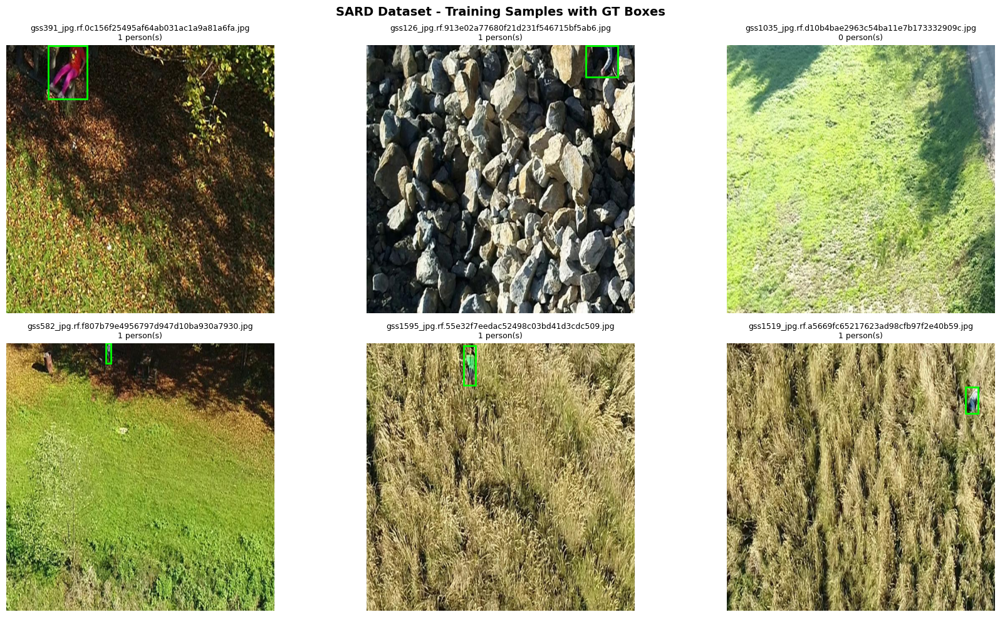

Saved: /kaggle/working/outputs/sample_images.png


In [6]:
def visualize_samples(img_dir: Path, lbl_dir: Path, n: int = 6, title: str = 'Samples'):
    """Display random sample images with ground-truth bounding boxes."""
    images  = sorted(img_dir.glob('*.*'))
    samples = random.sample(images, min(n, len(images)))

    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = np.array(axes).flatten()

    for ax, img_path in zip(axes, samples):
        img = np.array(Image.open(img_path).convert('RGB'))
        H, W = img.shape[:2]
        ax.imshow(img)
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        n_persons = 0
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    x1 = (cx - bw / 2) * W
                    y1 = (cy - bh / 2) * H
                    ax.add_patch(patches.Rectangle(
                        (x1, y1), bw * W, bh * H,
                        linewidth=2, edgecolor='lime', facecolor='none'
                    ))
                    n_persons += 1
        ax.set_title(f'{img_path.name}\n{n_persons} person(s)', fontsize=9)
        ax.axis('off')

    for ax in axes[len(samples):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_path = OUTPUT_DIR / 'sample_images.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {save_path}')

if 'train' in img_dirs:
    visualize_samples(
        img_dirs['train'], lbl_dirs['train'],
        n=6, title='SARD Dataset - Training Samples with GT Boxes'
    )


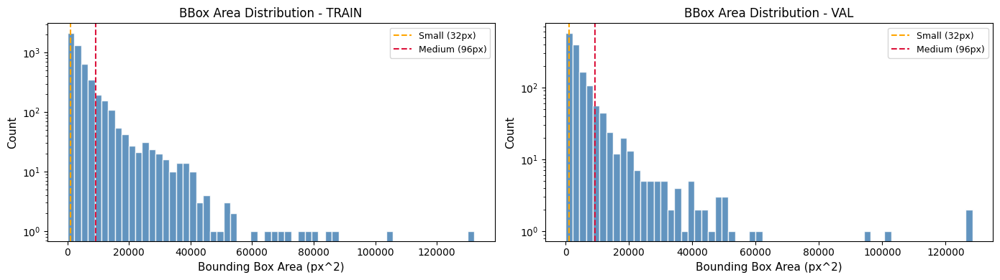

Saved: /kaggle/working/outputs/bbox_distribution.png


In [8]:
fig, axes = plt.subplots(1, len(all_areas), figsize=(7 * len(all_areas), 4))
if len(all_areas) == 1:
    axes = [axes]

for ax, (split, areas) in zip(axes, all_areas.items()):
    if not areas:
        continue
    ax.hist(areas, bins=60, color='steelblue', edgecolor='white', alpha=0.85)
    ax.axvline(32 ** 2, color='orange',  linestyle='--', lw=1.5, label='Small (32px)')
    ax.axvline(96 ** 2, color='crimson', linestyle='--', lw=1.5, label='Medium (96px)')
    ax.set_xlabel('Bounding Box Area (px^2)', fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.set_title(f'BBox Area Distribution - {split.upper()}', fontsize=12)
    ax.legend(fontsize=9)
    ax.set_yscale('log')

plt.tight_layout()
save_path = OUTPUT_DIR / 'bbox_distribution.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')


---
## 3. Dataset Preprocessing

Following the paper:
- Remove training images where **all bounding boxes have area < 10x10 px**
- Ensure single-class (person) YOLO format labels
- Build a unified `data.yaml` config


In [9]:
def filter_tiny_persons(
    src_img_dir: Path, src_lbl_dir: Path,
    dst_img_dir: Path, dst_lbl_dir: Path,
    min_area_px: int = 100
):
    """
    Copy images+labels to destination, skipping images where every
    annotation has pixel area < min_area_px.
    Labels are rewritten to ensure class index = 0 (person only).
    """
    dst_img_dir.mkdir(parents=True, exist_ok=True)
    dst_lbl_dir.mkdir(parents=True, exist_ok=True)

    images = sorted(src_img_dir.glob('*.*'))
    kept = skipped = 0

    for img_path in tqdm(images, desc=f'Filtering {src_img_dir.parent.name}'):
        lbl_path = src_lbl_dir / (img_path.stem + '.txt')
        img = Image.open(img_path)
        W, H = img.size

        valid_lines = []
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = int(parts[0]), *map(float, parts[1:5])
                    area_px = (bw * W) * (bh * H)
                    if area_px >= min_area_px:
                        valid_lines.append(f'0 {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}')

        if not valid_lines:
            skipped += 1
            continue

        shutil.copy(img_path, dst_img_dir / img_path.name)
        with open(dst_lbl_dir / (img_path.stem + '.txt'), 'w') as f:
            f.write('\n'.join(valid_lines))
        kept += 1

    print(f'  Kept: {kept}  |  Skipped (too small): {skipped}')
    return kept


# Map source splits to destination split names
split_map = []
if 'train' in img_dirs:
    split_map.append(('train', 'train', 100))
for src in ('val', 'valid'):
    if src in img_dirs:
        split_map.append((src, 'val', 1))
        break

processed_splits = set()
for src_split, dst_split, min_area in split_map:
    if dst_split in processed_splits:
        continue
    print(f'\nProcessing {dst_split} split (min_area={min_area} px^2)...')
    filter_tiny_persons(
        img_dirs[src_split], lbl_dirs[src_split],
        DATASET_DIR / dst_split / 'images',
        DATASET_DIR / dst_split / 'labels',
        min_area_px=min_area
    )
    processed_splits.add(dst_split)

print('\nPreprocessing complete.')



Processing train split (min_area=100 px^2)...


Filtering train: 100%|██████████| 4041/4041 [00:11<00:00, 347.05it/s]


  Kept: 3470  |  Skipped (too small): 571

Processing val split (min_area=1 px^2)...


Filtering valid: 100%|██████████| 1144/1144 [00:03<00:00, 372.34it/s]

  Kept: 967  |  Skipped (too small): 177

Preprocessing complete.


In [10]:
# Verify final split sizes
for split in ['train', 'val']:
    img_p = DATASET_DIR / split / 'images'
    lbl_p = DATASET_DIR / split / 'labels'
    if img_p.exists():
        n_imgs = len(list(img_p.glob('*.*')))
        n_lbls = len(list(lbl_p.glob('*.txt')))
        print(f'{split:6s}: {n_imgs} images, {n_lbls} label files')

data_yaml = {
    'path'  : str(DATASET_DIR),
    'train' : 'train/images',
    'val'   : 'val/images',
    'nc'    : 1,
    'names' : ['person']
}

yaml_path = DATASET_DIR / 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f'\ndata.yaml written to: {yaml_path}')
print(open(yaml_path).read())


train : 3470 images, 3470 label files
val   : 967 images, 967 label files

data.yaml written to: /kaggle/working/sard_yolo/data.yaml
names:
- person
nc: 1
path: /kaggle/working/sard_yolo
train: train/images
val: val/images



---
## 4. YOLOv8s Model Training

Training configuration matching the paper:

| Hyperparameter | Value |
|---|---|
| Model | YOLOv8s (11.2 M params) |
| Pretrained | COCO |
| Epochs | 100 (paper uses 500) |
| Image size | 640 |
| Batch size | 16 |
| Optimizer | SGD |
| Weight decay | 5e-4 |
| Initial LR | 1e-3 |
| Classes | 1 (person) |


In [11]:
model = YOLO('yolov8s.pt')
print(model.info())


YOLOv8s summary: 129 layers, 11,166,560 parameters, 0 gradients, 28.8 GFLOPs
(129, 11166560, 0, 28.816844800000002)


In [12]:
EPOCHS     = 50   # paper uses 500; set lower for faster iteration
BATCH_SIZE = 16
IMG_SIZE   = 640
RUN_NAME   = 'yolov8s_sard_person'

results = model.train(
    data         = str(yaml_path),
    epochs       = EPOCHS,
    imgsz        = IMG_SIZE,
    batch        = BATCH_SIZE,
    optimizer    = 'SGD',
    lr0          = 1e-3,
    lrf          = 0.01,
    weight_decay = 5e-4,
    momentum     = 0.937,
    warmup_epochs= 3,
    hsv_h        = 0.015,
    hsv_s        = 0.7,
    hsv_v        = 0.4,
    degrees      = 0.0,
    translate    = 0.1,
    scale        = 0.5,
    flipud       = 0.0,
    fliplr       = 0.5,
    mosaic       = 1.0,
    mixup        = 0.0,
    close_mosaic = 10,
    project      = str(OUTPUT_DIR),
    name         = RUN_NAME,
    exist_ok     = True,
    device       = 0 if torch.cuda.is_available() else 'cpu',
    workers      = 4,
    seed         = SEED,
    verbose      = True,
    save         = True,
    save_period  = 50,
    patience     = 50,
    conf         = 0.25,
    iou          = 0.5,
)

print('\nTraining complete.')
print(f'Best model: {OUTPUT_DIR}/{RUN_NAME}/weights/best.pt')


Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=0.25, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/sard_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.5, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8s_sard_person, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=Tru

---
## 5. Training Curves


Columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0    lr/pg1    lr/pg2
45     46  3128.14         0.98134         0.48669         0.97801               0.96856            0.90977           0.91280              0.63909       1.09745       0.49797       1.05270  0.000109  0.000109  0.000109
46     47  3196.17         0.98449         0.49934         0.98191               0.96137            0.91866           0.91314              0.64148       1.10536       0.50562       1.05687  0.000089  0.000089  0.000089
47     48  3263.92         0.98904         0.49438         0.98151               0.96716        

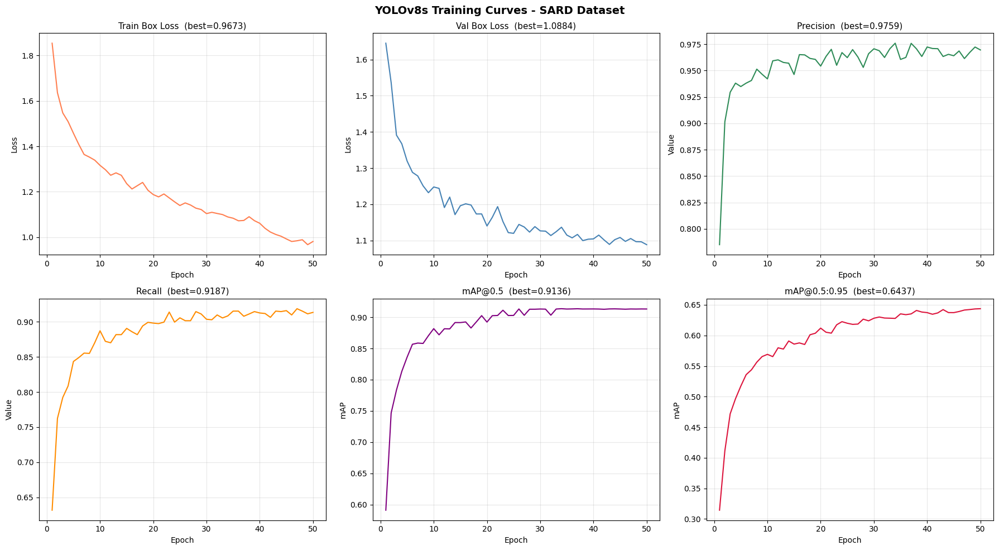

Saved: /kaggle/working/outputs/training_curves.png


In [13]:
run_dir     = OUTPUT_DIR / RUN_NAME
results_csv = run_dir / 'results.csv'

if not results_csv.exists():
    raise FileNotFoundError(f'results.csv not found at {results_csv}')

df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()
print('Columns:', list(df.columns))
print(df.tail(5).to_string())

# Auto-detect column names (column names vary across Ultralytics versions)
def find_col(df, *keywords):
    for c in df.columns:
        cl = c.lower()
        if all(k in cl for k in keywords):
            return c
    return None

col_map = {
    'train_box_loss': find_col(df, 'train', 'box'),
    'train_cls_loss': find_col(df, 'train', 'cls'),
    'val_box_loss'  : find_col(df, 'val', 'box'),
    'precision'     : find_col(df, 'precision'),
    'recall'        : find_col(df, 'recall'),
    'map50'         : find_col(df, 'map50') if find_col(df, 'map50-95') != find_col(df, 'map50') else None,
    'map50_95'      : find_col(df, 'map50-95'),
}

# Resolve map50 separately to avoid matching map50-95
for c in df.columns:
    cl = c.lower()
    if 'map50' in cl and '95' not in cl:
        col_map['map50'] = c
        break

epoch_col = 'epoch' if 'epoch' in df.columns else df.index

plot_specs = [
    ('train_box_loss', 'Train Box Loss',  'Loss', 'coral'),
    ('val_box_loss',   'Val Box Loss',    'Loss', 'steelblue'),
    ('precision',      'Precision',       'Value','seagreen'),
    ('recall',         'Recall',          'Value','darkorange'),
    ('map50',          'mAP@0.5',         'mAP',  'purple'),
    ('map50_95',       'mAP@0.5:0.95',    'mAP',  'crimson'),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
x = df[epoch_col] if isinstance(epoch_col, str) else df.index

for ax, (key, title, ylabel, color) in zip(axes.flatten(), plot_specs):
    col = col_map.get(key)
    if col and col in df.columns:
        y = df[col]
        ax.plot(x, y, color=color, linewidth=1.5)
        best = y.max() if 'loss' not in key else y.min()
        ax.set_title(f'{title}  (best={best:.4f})', fontsize=11)
    else:
        ax.set_title(f'{title} - column not found', fontsize=11)
    ax.set_xlabel('Epoch')
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)

plt.suptitle('YOLOv8s Training Curves - SARD Dataset', fontsize=14, fontweight='bold')
plt.tight_layout()
save_path = OUTPUT_DIR / 'training_curves.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')


---
## 6. Evaluation on Validation Set

Metrics:
- **Precision (P)** and **Recall (R)**
- **mAP@0.5** and **mAP@0.5:0.95**
- **ROpti** = (TP - FP) / (TP + FN) — penalises false positives, critical in SAR


In [14]:
best_weights = OUTPUT_DIR / RUN_NAME / 'weights' / 'best.pt'
if not best_weights.exists():
    print(f'best.pt not found at {best_weights}, falling back to last.pt')
    best_weights = OUTPUT_DIR / RUN_NAME / 'weights' / 'last.pt'

print(f'Loading weights from: {best_weights}')
best_model = YOLO(str(best_weights))

val_results = best_model.val(
    data    = str(yaml_path),
    imgsz   = IMG_SIZE,
    batch   = BATCH_SIZE,
    conf    = 0.25,
    iou     = 0.5,
    device  = 0 if torch.cuda.is_available() else 'cpu',
    verbose = True,
)

our_p   = val_results.results_dict.get('metrics/precision(B)', 0) * 100
our_r   = val_results.results_dict.get('metrics/recall(B)',    0) * 100
our_m50 = val_results.results_dict.get('metrics/mAP50(B)',     0) * 100
our_m95 = val_results.results_dict.get('metrics/mAP50-95(B)', 0) * 100

print('\n' + '='*50)
print(' VALIDATION RESULTS')
print('='*50)
print(f'  Precision    : {our_p:.4f}%')
print(f'  Recall       : {our_r:.4f}%')
print(f'  mAP@0.5      : {our_m50:.4f}%')
print(f'  mAP@0.5:0.95 : {our_m95:.4f}%')


Loading weights from: /kaggle/working/outputs/yolov8s_sard_person/weights/best.pt
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1765.2±1069.3 MB/s, size: 107.4 KB)
val: Scanning /kaggle/working/sard_yolo/val/labels.cache... 967 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 967/967 312.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 4.2it/s 14.5s0.2s
                   all        967       1463       0.97      0.913      0.913      0.645
Speed: 1.1ms preprocess, 10.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

 VALIDATION RESULTS
  Precision    : 96.9528%
  Recall       : 91.3393%
  mAP@0.5      : 91.3116%
  mAP@0.5:0.95 : 64.4553%


In [15]:
def compute_ropti(model, img_dir: Path, lbl_dir: Path,
                  conf: float = 0.25, iou_thresh: float = 0.5,
                  img_size: int = 640) -> dict:
    """Compute ROpti = (TP - FP) / (TP + FN) over all validation images."""
    images = sorted(img_dir.glob('*.*'))
    TP = FP = FN = 0

    for img_path in tqdm(images, desc='Computing ROpti'):
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        img = Image.open(img_path)
        W, H = img.size
        gt_boxes = []
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    gt_boxes.append([
                        (cx - bw / 2) * W, (cy - bh / 2) * H,
                        (cx + bw / 2) * W, (cy + bh / 2) * H
                    ])

        preds = model.predict(str(img_path), conf=conf, iou=iou_thresh,
                              imgsz=img_size, verbose=False)
        pred_boxes = []
        if preds and preds[0].boxes is not None:
            pred_boxes = preds[0].boxes.xyxy.cpu().numpy().tolist()

        matched_gt = set()
        for pb in pred_boxes:
            best_iou, best_idx = 0, -1
            for gi, gb in enumerate(gt_boxes):
                if gi in matched_gt:
                    continue
                ix1 = max(pb[0], gb[0]); iy1 = max(pb[1], gb[1])
                ix2 = min(pb[2], gb[2]); iy2 = min(pb[3], gb[3])
                inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
                area_p = (pb[2] - pb[0]) * (pb[3] - pb[1])
                area_g = (gb[2] - gb[0]) * (gb[3] - gb[1])
                iou_val = inter / (area_p + area_g - inter + 1e-6)
                if iou_val > best_iou:
                    best_iou, best_idx = iou_val, gi
            if best_iou >= iou_thresh and best_idx >= 0:
                TP += 1
                matched_gt.add(best_idx)
            else:
                FP += 1
        FN += len(gt_boxes) - len(matched_gt)

    precision = TP / (TP + FP + 1e-6)
    recall    = TP / (TP + FN + 1e-6)
    ropti     = (TP - FP) / (TP + FN + 1e-6)
    return dict(TP=TP, FP=FP, FN=FN,
                Precision=precision, Recall=recall, ROpti=ropti)


ropti_results = compute_ropti(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    conf=0.25, iou_thresh=0.5
)

print('\n' + '='*50)
print(' ROPTI & DETECTION METRICS')
print('='*50)
for k, v in ropti_results.items():
    fmt = f'{v:.4f}' if isinstance(v, float) else str(v)
    print(f'  {k:<12}: {fmt}')


Computing ROpti: 100%|██████████| 967/967 [00:14<00:00, 66.65it/s]


 ROPTI & DETECTION METRICS
  TP          : 1346
  FP          : 51
  FN          : 117
  Precision   : 0.9635
  Recall      : 0.9200
  ROpti       : 0.8852


In [16]:
# Comparison table: our results vs. paper (Sambolek & Ivasic-Kos 2024)
paper_results = {
    'Model'           : ['YOLOv8n@SARD', 'YOLOv8s@SARD', 'YOLOv8m@SARD',
                         'YOLOv8l@SARD', 'YOLOv8x@SARD'],
    'Precision (%)'   : [93, 94, 93, 94, 95],
    'Recall (%)'      : [78, 81, 83, 83, 83],
    'mAP@0.5 (%)'     : [86.8, 90.3, 90.6, 90.8, 91.3],
    'mAP@0.5:0.95 (%)': [54.9, 60.6, 62.1, 60.8, 63.8],
    'ROpti'           : [0.71, 0.76, 0.77, 0.78, 0.79],
    'Speed (ms)'      : [4.6,  8.0, 17.3, 34.4, 46.5],
}
df_paper = pd.DataFrame(paper_results)

our_row = pd.DataFrame([{
    'Model'           : 'YOLOv8s@SARD (ours)',
    'Precision (%)'   : round(our_p, 1),
    'Recall (%)'      : round(our_r, 1),
    'mAP@0.5 (%)'     : round(our_m50, 1),
    'mAP@0.5:0.95 (%)': round(our_m95, 1),
    'ROpti'           : round(ropti_results.get('ROpti', 0), 4),
    'Speed (ms)'      : 'see below',
}])

df_compare = pd.concat([df_paper, our_row], ignore_index=True)
print('\nComparison with paper results:')
print(df_compare.to_string(index=False))



Comparison with paper results:
              Model  Precision (%)  Recall (%)  mAP@0.5 (%)  mAP@0.5:0.95 (%)  ROpti Speed (ms)
       YOLOv8n@SARD           93.0        78.0         86.8              54.9 0.7100        4.6
       YOLOv8s@SARD           94.0        81.0         90.3              60.6 0.7600        8.0
       YOLOv8m@SARD           93.0        83.0         90.6              62.1 0.7700       17.3
       YOLOv8l@SARD           94.0        83.0         90.8              60.8 0.7800       34.4
       YOLOv8x@SARD           95.0        83.0         91.3              63.8 0.7900       46.5
YOLOv8s@SARD (ours)           97.0        91.3         91.3              64.5 0.8852  see below


---
## 7. Inference & Visualisation


In [17]:
val_images = sorted((DATASET_DIR / 'val' / 'images').glob('*.*'))[:50]

if not val_images:
    print('No validation images found for speed test.')
    avg_ms = float('nan')
else:
    # Warm-up pass
    _ = best_model.predict(str(val_images[0]), imgsz=IMG_SIZE, verbose=False)

    start = time.perf_counter()
    for img_path in val_images:
        _ = best_model.predict(str(img_path), imgsz=IMG_SIZE, conf=0.25, verbose=False)
    elapsed = time.perf_counter() - start
    avg_ms  = elapsed / len(val_images) * 1000

    print(f'Inference speed : {avg_ms:.2f} ms/image  ({1000/avg_ms:.1f} FPS)')
    print(f'Paper YOLOv8s@SARD: 8.0 ms (single-image, GPU)')


Inference speed : 14.10 ms/image  (70.9 FPS)
Paper YOLOv8s@SARD: 8.0 ms (single-image, GPU)


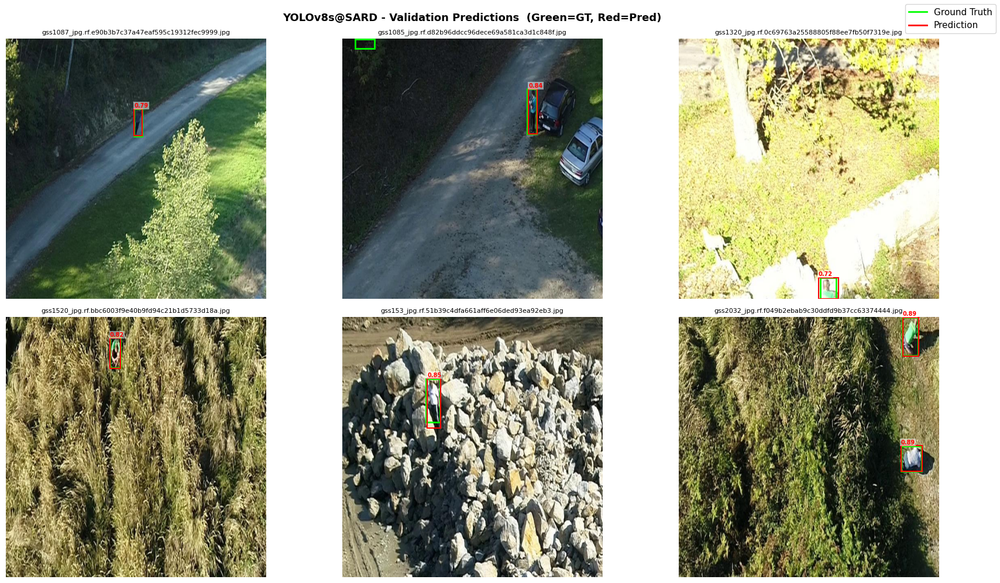

Saved: /kaggle/working/outputs/predictions_visualization.png


In [18]:
def visualize_predictions(model, img_dir: Path, lbl_dir: Path,
                           n: int = 6, conf: float = 0.25,
                           title: str = 'Predictions'):
    """Show GT (green) vs predictions (red)."""
    images  = sorted(img_dir.glob('*.*'))
    samples = random.sample(images, min(n, len(images)))

    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = np.array(axes).flatten()

    for ax, img_path in zip(axes, samples):
        img_arr = np.array(Image.open(img_path).convert('RGB'))
        H, W    = img_arr.shape[:2]
        ax.imshow(img_arr)

        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    x1 = (cx - bw / 2) * W
                    y1 = (cy - bh / 2) * H
                    ax.add_patch(patches.Rectangle(
                        (x1, y1), bw * W, bh * H,
                        linewidth=2, edgecolor='lime', facecolor='none'
                    ))

        preds = model.predict(str(img_path), conf=conf,
                              imgsz=IMG_SIZE, verbose=False)
        if preds and preds[0].boxes is not None:
            for box in preds[0].boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                score = float(box.conf[0].cpu())
                ax.add_patch(patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    linewidth=1.5, edgecolor='red', facecolor='none'
                ))
                ax.text(x1, y1 - 4, f'{score:.2f}', color='red',
                        fontsize=7, fontweight='bold',
                        bbox=dict(facecolor='white', alpha=0.5,
                                  pad=1, edgecolor='none'))

        ax.set_title(img_path.name, fontsize=8)
        ax.axis('off')

    legend_elements = [
        Line2D([0], [0], color='lime', lw=2, label='Ground Truth'),
        Line2D([0], [0], color='red',  lw=2, label='Prediction'),
    ]
    fig.legend(handles=legend_elements, loc='upper right', fontsize=11)

    for ax in axes[len(samples):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    save_path = OUTPUT_DIR / 'predictions_visualization.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {save_path}')


visualize_predictions(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    n=6, conf=0.25,
    title='YOLOv8s@SARD - Validation Predictions  (Green=GT, Red=Pred)'
)


Running confidence threshold sweep...


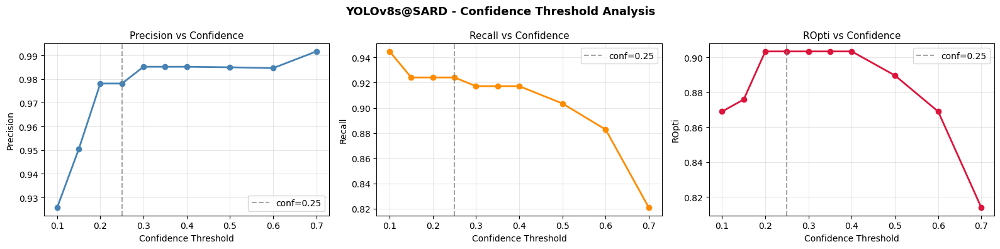


Aggregated results per confidence threshold:
 conf  Precision   Recall    ROpti
 0.10   0.925676 0.944828 0.868966
 0.15   0.950355 0.924138 0.875862
 0.20   0.978102 0.924138 0.903448
 0.25   0.978102 0.924138 0.903448
 0.30   0.985185 0.917241 0.903448
 0.35   0.985185 0.917241 0.903448
 0.40   0.985185 0.917241 0.903448
 0.50   0.984962 0.903448 0.889655
 0.60   0.984615 0.882759 0.868966
 0.70   0.991667 0.820690 0.813793


In [19]:
def sweep_confidence(
    model, img_dir: Path, lbl_dir: Path,
    thresholds=None, iou_thresh: float = 0.5, sample_size: int = 100
):
    """Sweep confidence thresholds and compute aggregated Precision, Recall, ROpti."""
    if thresholds is None:
        thresholds = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7]

    images = sorted(img_dir.glob('*.*'))
    if len(images) > sample_size:
        images = random.sample(images, sample_size)

    rows = []
    for conf in thresholds:
        TP = FP = FN = 0
        for img_path in tqdm(images, desc=f'conf={conf:.2f}', leave=False):
            lbl_path = lbl_dir / (img_path.stem + '.txt')
            img = Image.open(img_path)
            W, H = img.size
            gt_boxes = []
            if lbl_path.exists():
                with open(lbl_path) as f:
                    for line in f:
                        p = line.strip().split()
                        if len(p) < 5:
                            continue
                        _, cx, cy, bw, bh = map(float, p[:5])
                        gt_boxes.append([
                            (cx - bw / 2) * W, (cy - bh / 2) * H,
                            (cx + bw / 2) * W, (cy + bh / 2) * H
                        ])
            preds = model.predict(str(img_path), conf=conf,
                                  imgsz=IMG_SIZE, verbose=False)
            pred_boxes = []
            if preds and preds[0].boxes is not None:
                pred_boxes = preds[0].boxes.xyxy.cpu().numpy().tolist()
            matched = set()
            for pb in pred_boxes:
                best_iou, best_idx = 0, -1
                for gi, gb in enumerate(gt_boxes):
                    if gi in matched:
                        continue
                    ix1 = max(pb[0], gb[0]); iy1 = max(pb[1], gb[1])
                    ix2 = min(pb[2], gb[2]); iy2 = min(pb[3], gb[3])
                    inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
                    ap = (pb[2] - pb[0]) * (pb[3] - pb[1])
                    ag = (gb[2] - gb[0]) * (gb[3] - gb[1])
                    iou_v = inter / (ap + ag - inter + 1e-6)
                    if iou_v > best_iou:
                        best_iou, best_idx = iou_v, gi
                if best_iou >= iou_thresh and best_idx >= 0:
                    TP += 1
                    matched.add(best_idx)
                else:
                    FP += 1
            FN += len(gt_boxes) - len(matched)
        # Aggregate one row per threshold
        rows.append(dict(
            conf      = conf,
            Precision = TP / (TP + FP + 1e-6),
            Recall    = TP / (TP + FN + 1e-6),
            ROpti     = (TP - FP) / (TP + FN + 1e-6)
        ))
    return pd.DataFrame(rows)


print('Running confidence threshold sweep...')
sweep_df = sweep_confidence(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    sample_size=100
)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, col, color in zip(axes,
                          ['Precision', 'Recall', 'ROpti'],
                          ['steelblue', 'darkorange', 'crimson']):
    ax.plot(sweep_df['conf'], sweep_df[col], marker='o', color=color, lw=2)
    ax.axvline(0.25, linestyle='--', color='gray', alpha=0.7, label='conf=0.25')
    ax.set_xlabel('Confidence Threshold')
    ax.set_ylabel(col)
    ax.set_title(f'{col} vs Confidence', fontsize=11)
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('YOLOv8s@SARD - Confidence Threshold Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
save_path = OUTPUT_DIR / 'confidence_sweep.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print('\nAggregated results per confidence threshold:')
print(sweep_df.to_string(index=False))


---
## 8. Export & Summary


In [20]:
print('Exporting to ONNX...')
onnx_path = best_model.export(format='onnx', imgsz=IMG_SIZE, opset=12, simplify=True)
print(f'ONNX model saved: {onnx_path}')

for fname in ['best.pt', 'last.pt']:
    src = OUTPUT_DIR / RUN_NAME / 'weights' / fname
    if src.exists():
        shutil.copy(src, OUTPUT_DIR / fname)
        print(f'Copied {fname} -> {OUTPUT_DIR / fname}')


Exporting to ONNX...
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/kaggle/working/outputs/yolov8s_sard_person/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 12 packages in 248ms
Prepared 2 packages in 2.25s
Installed 2 packages in 14ms
 + onnxruntime-gpu==1.25.0
 + onnxslim==0.1.91

requirements: AutoUpdate success ✅ 3.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.20.1 opset 12...
ONNX: slimming with onnxslim 0.1.91...
ONNX: export success ✅ 5.1s, saved as '/kaggle/working/outputs/yolov8s_sa

In [21]:
print('\n' + '='*60)
print(' FINAL SUMMARY - YOLOv8s@SARD')
print('='*60)
print(f'  Model          : YOLOv8s fine-tuned on SARD')
print(f'  Epochs trained : {EPOCHS}')
print(f'  Image size     : {IMG_SIZE} px')
print(f'  Batch size     : {BATCH_SIZE}')
print()
print('  --- Validation Metrics ---')
print(f'  Precision    : {our_p:.2f}%   (paper YOLOv8s: 94%)')
print(f'  Recall       : {our_r:.2f}%   (paper YOLOv8s: 81%)')
print(f'  mAP@0.5      : {our_m50:.2f}%   (paper YOLOv8s: 90.3%)')
print(f'  mAP@0.5:0.95 : {our_m95:.2f}%   (paper YOLOv8s: 60.6%)')
print(f'  ROpti        : {ropti_results["ROpti"]:.4f}  (paper YOLOv8s: 0.76)')
print(f'  Speed        : {avg_ms:.1f} ms/img')
print()
print('  --- Output Files ---')
for fp in sorted(OUTPUT_DIR.rglob('*')):
    if fp.is_file():
        print(f'  {fp.relative_to(OUTPUT_DIR)}')



 FINAL SUMMARY - YOLOv8s@SARD
  Model          : YOLOv8s fine-tuned on SARD
  Epochs trained : 50
  Image size     : 640 px
  Batch size     : 16

  --- Validation Metrics ---
  Precision    : 96.95%   (paper YOLOv8s: 94%)
  Recall       : 91.34%   (paper YOLOv8s: 81%)
  mAP@0.5      : 91.31%   (paper YOLOv8s: 90.3%)
  mAP@0.5:0.95 : 64.46%   (paper YOLOv8s: 60.6%)
  ROpti        : 0.8852  (paper YOLOv8s: 0.76)
  Speed        : 14.1 ms/img

  --- Output Files ---
  bbox_distribution.png
  best.pt
  confidence_sweep.png
  last.pt
  predictions_visualization.png
  sample_images.png
  training_curves.png
  yolov8s_sard_person/BoxF1_curve.png
  yolov8s_sard_person/BoxPR_curve.png
  yolov8s_sard_person/BoxP_curve.png
  yolov8s_sard_person/BoxR_curve.png
  yolov8s_sard_person/args.yaml
  yolov8s_sard_person/confusion_matrix.png
  yolov8s_sard_person/confusion_matrix_normalized.png
  yolov8s_sard_person/labels.jpg
  yolov8s_sard_person/results.csv
  yolov8s_sard_person/results.png
  yolov8s_

---
## 6b. COCO-Pretrained Baseline Evaluation

Run the stock `yolov8s.pt` (COCO weights, no fine-tuning) on the same SARD
validation set so every metric is computed identically. This gives a fair
apples-to-apples comparison that justifies why domain-specific fine-tuning
on SARD is necessary.

**Important:** COCO was trained on 80 classes. Person is class index 0,
so we filter predictions to class 0 only before computing metrics.


In [22]:
# Load the stock COCO-pretrained YOLOv8s (no fine-tuning)
coco_model = YOLO('yolov8s.pt')
print(coco_model.info())

# Run .val() with classes=[0] to restrict to 'person' only.
# We use the same data.yaml so the val split is identical.
coco_val_results = coco_model.val(
    data    = str(yaml_path),
    imgsz   = IMG_SIZE,
    batch   = BATCH_SIZE,
    conf    = 0.25,
    iou     = 0.5,
    classes = [0],   # person class only (COCO index 0)
    device  = 0 if torch.cuda.is_available() else 'cpu',
    verbose = True,
)

coco_p   = coco_val_results.results_dict.get('metrics/precision(B)', 0) * 100
coco_r   = coco_val_results.results_dict.get('metrics/recall(B)',    0) * 100
coco_m50 = coco_val_results.results_dict.get('metrics/mAP50(B)',     0) * 100
coco_m95 = coco_val_results.results_dict.get('metrics/mAP50-95(B)', 0) * 100

print('\n' + '='*50)
print(' COCO BASELINE - VALIDATION ON SARD')
print('='*50)
print(f'  Precision    : {coco_p:.4f}%')
print(f'  Recall       : {coco_r:.4f}%')
print(f'  mAP@0.5      : {coco_m50:.4f}%')
print(f'  mAP@0.5:0.95 : {coco_m95:.4f}%')


YOLOv8s summary: 129 layers, 11,166,560 parameters, 0 gradients, 28.8 GFLOPs
(129, 11166560, 0, 28.816844800000002)
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2219.7±593.4 MB/s, size: 102.6 KB)
val: Scanning /kaggle/working/sard_yolo/val/labels.cache... 967 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 967/967 338.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 4.2it/s 14.5s0.2s
                   all        967       1463      0.928      0.202        0.2      0.117
                person        967       1463      0.928      0.202        0.2      0.117
Speed: 1.0ms preprocess, 11.4ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/runs/detect/val-2

 COCO BASELINE - VALIDATION ON SARD
  Precision

In [23]:
# Compute ROpti for the COCO baseline.
# compute_ropti() is already defined in cell 20; we reuse it here.
# We pass classes=[0] via the conf-sweep predict calls inside the function,
# so we wrap predict to pin class filtering.

class _ClassFilteredModel:
    """Thin wrapper that pins classes=[0] on every predict call."""
    def __init__(self, model):
        self._m = model
    def predict(self, *args, **kwargs):
        kwargs.setdefault('classes', [0])
        return self._m.predict(*args, **kwargs)

coco_model_filtered = _ClassFilteredModel(coco_model)

coco_ropti_results = compute_ropti(
    coco_model_filtered,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    conf=0.25, iou_thresh=0.5
)

print('\n' + '='*50)
print(' COCO BASELINE - ROPTI & DETECTION METRICS')
print('='*50)
for k, v in coco_ropti_results.items():
    fmt = f'{v:.4f}' if isinstance(v, float) else str(v)
    print(f'  {k:<12}: {fmt}')


Computing ROpti: 100%|██████████| 967/967 [00:14<00:00, 67.92it/s]


 COCO BASELINE - ROPTI & DETECTION METRICS
  TP          : 316
  FP          : 24
  FN          : 1147
  Precision   : 0.9294
  Recall      : 0.2160
  ROpti       : 0.1996


In [24]:
# Speed benchmark for COCO baseline (same 50-image sample)
if val_images:
    _ = coco_model.predict(str(val_images[0]), imgsz=IMG_SIZE,
                           classes=[0], verbose=False)
    start = time.perf_counter()
    for img_path in val_images:
        _ = coco_model.predict(str(img_path), imgsz=IMG_SIZE,
                               conf=0.25, classes=[0], verbose=False)
    elapsed = time.perf_counter() - start
    coco_avg_ms = elapsed / len(val_images) * 1000
    print(f'COCO baseline inference: {coco_avg_ms:.2f} ms/image  ({1000/coco_avg_ms:.1f} FPS)')
else:
    coco_avg_ms = float('nan')
    print('No validation images found for speed test.')


COCO baseline inference: 15.80 ms/image  (63.3 FPS)


In [25]:
# Full side-by-side comparison: COCO baseline vs our SARD fine-tuned model
metrics = ['Precision (%)', 'Recall (%)', 'mAP@0.5 (%)', 'mAP@0.5:0.95 (%)',
           'ROpti', 'TP', 'FP', 'FN', 'Speed (ms)']

df_direct = pd.DataFrame({
    'Metric': metrics,
    'COCO pretrained (baseline)': [
        round(coco_p,   2),
        round(coco_r,   2),
        round(coco_m50, 2),
        round(coco_m95, 2),
        round(coco_ropti_results['ROpti'],      4),
        coco_ropti_results['TP'],
        coco_ropti_results['FP'],
        coco_ropti_results['FN'],
        round(coco_avg_ms, 2),
    ],
    'SARD fine-tuned (ours)': [
        round(our_p,   2),
        round(our_r,   2),
        round(our_m50, 2),
        round(our_m95, 2),
        round(ropti_results['ROpti'],      4),
        ropti_results['TP'],
        ropti_results['FP'],
        ropti_results['FN'],
        round(avg_ms, 2),
    ],
})

# Compute absolute and relative gains
numeric_metrics = ['Precision (%)', 'Recall (%)', 'mAP@0.5 (%)',
                   'mAP@0.5:0.95 (%)', 'ROpti']
gains = []
for _, row in df_direct.iterrows():
    if row['Metric'] in numeric_metrics:
        try:
            base = float(row['COCO pretrained (baseline)'])
            ours = float(row['SARD fine-tuned (ours)'])
            delta = ours - base
            rel   = (delta / base * 100) if base != 0 else float('nan')
            gains.append(f'+{delta:.2f} ({rel:+.1f}%)' if delta >= 0
                         else f'{delta:.2f} ({rel:+.1f}%)')
        except (ValueError, TypeError):
            gains.append('n/a')
    else:
        gains.append('')
df_direct['Delta (SARD - COCO)'] = gains

print('\n' + '='*70)
print(' DIRECT COMPARISON: COCO baseline vs SARD fine-tuned')
print('='*70)
print(df_direct.to_string(index=False))



 DIRECT COMPARISON: COCO baseline vs SARD fine-tuned
          Metric  COCO pretrained (baseline)  SARD fine-tuned (ours) Delta (SARD - COCO)
   Precision (%)                     92.7900                 96.9500       +4.16 (+4.5%)
      Recall (%)                     20.2300                 91.3400    +71.11 (+351.5%)
     mAP@0.5 (%)                     19.9600                 91.3100    +71.35 (+357.5%)
mAP@0.5:0.95 (%)                     11.7400                 64.4600    +52.72 (+449.1%)
           ROpti                      0.1996                  0.8852     +0.69 (+343.5%)
              TP                    316.0000               1346.0000                    
              FP                     24.0000                 51.0000                    
              FN                   1147.0000                117.0000                    
      Speed (ms)                     15.8000                 14.1000                    


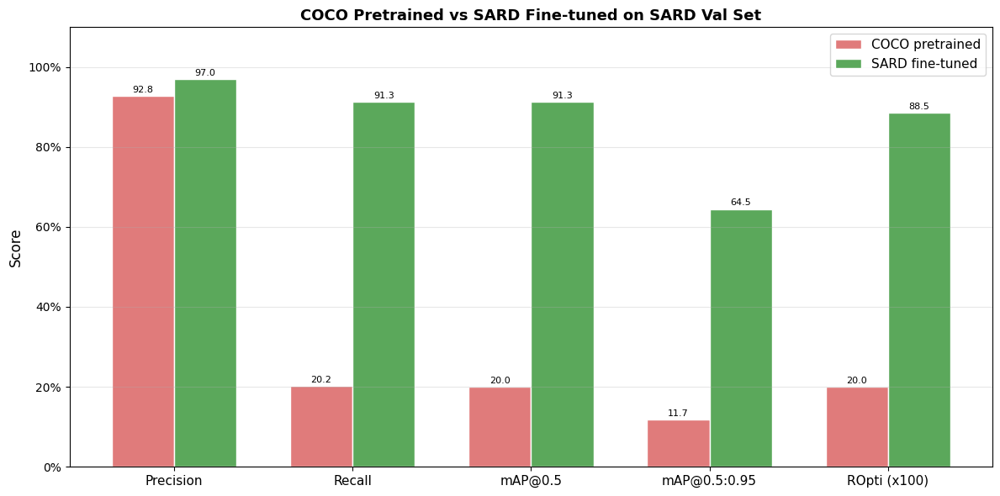

Saved: /kaggle/working/outputs/coco_vs_sard_comparison.png


In [26]:
# Bar chart: key metrics side by side
bar_metrics  = ['Precision (%)', 'Recall (%)', 'mAP@0.5 (%)',
                'mAP@0.5:0.95 (%)', 'ROpti']

# Scale ROpti to percentage for a uniform y-axis
def extract_val(df, metric, col):
    val = df.loc[df['Metric'] == metric, col].values[0]
    return float(val) * (100 if metric == 'ROpti' else 1)

coco_vals = [extract_val(df_direct, m, 'COCO pretrained (baseline)')
             for m in bar_metrics]
sard_vals = [extract_val(df_direct, m, 'SARD fine-tuned (ours)')
             for m in bar_metrics]

x     = range(len(bar_metrics))
width = 0.35
labels = ['Precision', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95', 'ROpti (x100)']

fig, ax = plt.subplots(figsize=(12, 6))
bars_coco = ax.bar([i - width / 2 for i in x], coco_vals,
                   width, label='COCO pretrained', color='#e07b7b', edgecolor='white')
bars_sard = ax.bar([i + width / 2 for i in x], sard_vals,
                   width, label='SARD fine-tuned', color='#5ba85b', edgecolor='white')

for bar in bars_coco:
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
            f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=8)
for bar in bars_sard:
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
            f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=8)

ax.set_xticks(list(x))
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel('Score', fontsize=12)
ax.set_ylim(0, 110)
ax.set_title('COCO Pretrained vs SARD Fine-tuned on SARD Val Set',
             fontsize=13, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))

plt.tight_layout()
save_path = OUTPUT_DIR / 'coco_vs_sard_comparison.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')


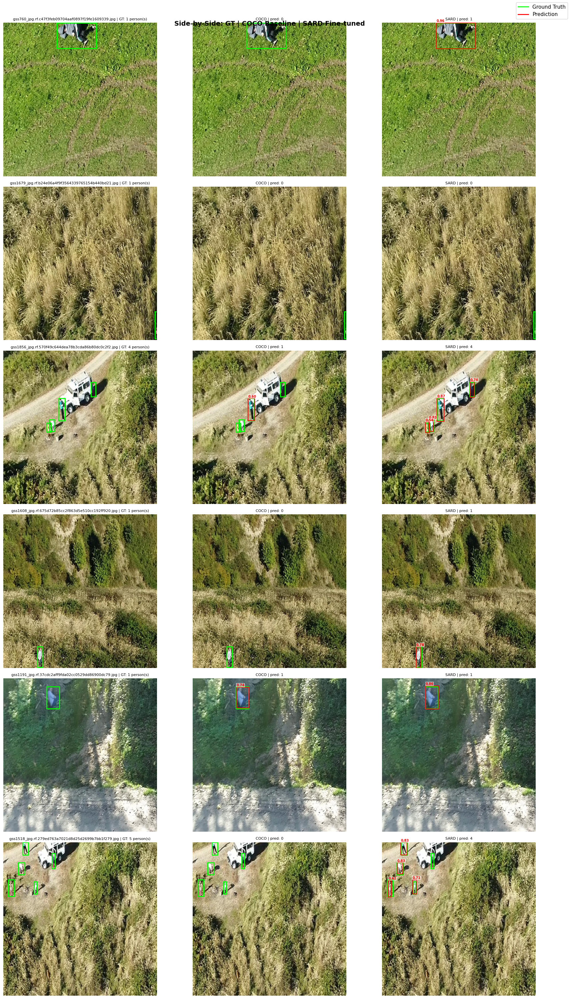

Saved: /kaggle/working/outputs/coco_vs_sard_visual.png


In [27]:
# Visual comparison: same images, COCO predictions vs SARD predictions side by side.
# Each row is one image: [GT | COCO baseline | SARD fine-tuned]

def draw_boxes_on_ax(ax, img_arr, boxes_gt, boxes_pred, title):
    """Draw GT (green) and predicted (red) boxes on a single axis."""
    H, W = img_arr.shape[:2]
    ax.imshow(img_arr)
    for gb in boxes_gt:
        x1, y1, x2, y2 = gb
        ax.add_patch(patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor='lime', facecolor='none'
        ))
    for pb, score in boxes_pred:
        x1, y1, x2, y2 = pb
        ax.add_patch(patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=1.5, edgecolor='red', facecolor='none'
        ))
        ax.text(x1, y1 - 4, f'{score:.2f}', color='red', fontsize=7,
                fontweight='bold',
                bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))
    ax.set_title(title, fontsize=8)
    ax.axis('off')


def get_gt_boxes(lbl_path, W, H):
    boxes = []
    if lbl_path.exists():
        with open(lbl_path) as f:
            for line in f:
                p = line.strip().split()
                if len(p) < 5:
                    continue
                _, cx, cy, bw, bh = map(float, p[:5])
                boxes.append([
                    (cx - bw / 2) * W, (cy - bh / 2) * H,
                    (cx + bw / 2) * W, (cy + bh / 2) * H
                ])
    return boxes


def get_pred_boxes(model, img_path, conf=0.25, classes=None):
    kwargs = dict(imgsz=IMG_SIZE, conf=conf, verbose=False)
    if classes is not None:
        kwargs['classes'] = classes
    preds = model.predict(str(img_path), **kwargs)
    boxes = []
    if preds and preds[0].boxes is not None:
        for box in preds[0].boxes:
            xyxy  = box.xyxy[0].cpu().numpy().tolist()
            score = float(box.conf[0].cpu())
            boxes.append((xyxy, score))
    return boxes


N_SAMPLES = 6
val_img_dir = DATASET_DIR / 'val' / 'images'
val_lbl_dir = DATASET_DIR / 'val' / 'labels'
all_val_imgs = sorted(val_img_dir.glob('*.*'))
samples = random.sample(all_val_imgs, min(N_SAMPLES, len(all_val_imgs)))

fig, axes = plt.subplots(N_SAMPLES, 3,
                         figsize=(18, 5 * N_SAMPLES),
                         squeeze=False)

col_titles = ['Ground Truth', 'COCO Pretrained', 'SARD Fine-tuned']
for col_idx, title in enumerate(col_titles):
    axes[0][col_idx].set_title(title, fontsize=12, fontweight='bold', pad=10)

for row_idx, img_path in enumerate(samples):
    img_arr = np.array(Image.open(img_path).convert('RGB'))
    H, W    = img_arr.shape[:2]
    lbl_path = val_lbl_dir / (img_path.stem + '.txt')

    gt_boxes   = get_gt_boxes(lbl_path, W, H)
    coco_boxes = get_pred_boxes(coco_model,  img_path, conf=0.25, classes=[0])
    sard_boxes = get_pred_boxes(best_model,  img_path, conf=0.25)

    # Column 0: GT only
    draw_boxes_on_ax(axes[row_idx][0], img_arr, gt_boxes, [],
                     f'{img_path.name} | GT: {len(gt_boxes)} person(s)')
    # Column 1: COCO baseline
    draw_boxes_on_ax(axes[row_idx][1], img_arr, gt_boxes, coco_boxes,
                     f'COCO | pred: {len(coco_boxes)}')
    # Column 2: SARD fine-tuned
    draw_boxes_on_ax(axes[row_idx][2], img_arr, gt_boxes, sard_boxes,
                     f'SARD | pred: {len(sard_boxes)}')

legend_elements = [
    Line2D([0], [0], color='lime', lw=2, label='Ground Truth'),
    Line2D([0], [0], color='red',  lw=2, label='Prediction'),
]
fig.legend(handles=legend_elements, loc='upper right', fontsize=11)
plt.suptitle('Side-by-Side: GT | COCO Baseline | SARD Fine-tuned',
             fontsize=14, fontweight='bold')
plt.tight_layout()
save_path = OUTPUT_DIR / 'coco_vs_sard_visual.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')


---
## 7. Inference & Visualisation


In [28]:
val_images = sorted((DATASET_DIR / 'val' / 'images').glob('*.*'))[:50]

if not val_images:
    print('No validation images found for speed test.')
    avg_ms = float('nan')
else:
    # Warm-up pass
    _ = best_model.predict(str(val_images[0]), imgsz=IMG_SIZE, verbose=False)

    start = time.perf_counter()
    for img_path in val_images:
        _ = best_model.predict(str(img_path), imgsz=IMG_SIZE, conf=0.25, verbose=False)
    elapsed = time.perf_counter() - start
    avg_ms  = elapsed / len(val_images) * 1000

    print(f'Inference speed : {avg_ms:.2f} ms/image  ({1000/avg_ms:.1f} FPS)')
    print(f'Paper YOLOv8s@SARD: 8.0 ms (single-image, GPU)')


Inference speed : 15.70 ms/image  (63.7 FPS)
Paper YOLOv8s@SARD: 8.0 ms (single-image, GPU)


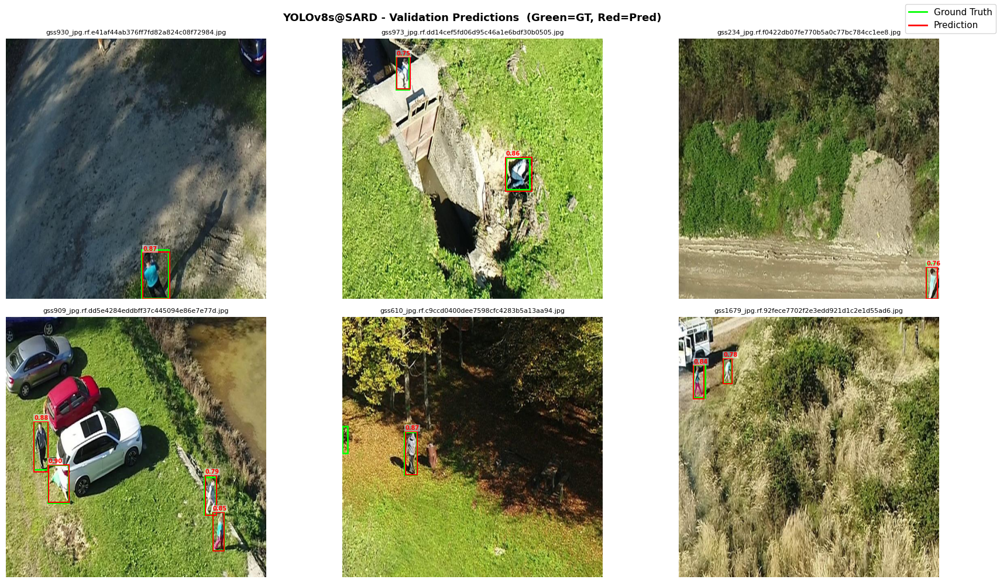

Saved: /kaggle/working/outputs/predictions_visualization.png


In [29]:
def visualize_predictions(model, img_dir: Path, lbl_dir: Path,
                           n: int = 6, conf: float = 0.25,
                           title: str = 'Predictions'):
    """Show GT (green) vs predictions (red)."""
    images  = sorted(img_dir.glob('*.*'))
    samples = random.sample(images, min(n, len(images)))

    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = np.array(axes).flatten()

    for ax, img_path in zip(axes, samples):
        img_arr = np.array(Image.open(img_path).convert('RGB'))
        H, W    = img_arr.shape[:2]
        ax.imshow(img_arr)

        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    x1 = (cx - bw / 2) * W
                    y1 = (cy - bh / 2) * H
                    ax.add_patch(patches.Rectangle(
                        (x1, y1), bw * W, bh * H,
                        linewidth=2, edgecolor='lime', facecolor='none'
                    ))

        preds = model.predict(str(img_path), conf=conf,
                              imgsz=IMG_SIZE, verbose=False)
        if preds and preds[0].boxes is not None:
            for box in preds[0].boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                score = float(box.conf[0].cpu())
                ax.add_patch(patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    linewidth=1.5, edgecolor='red', facecolor='none'
                ))
                ax.text(x1, y1 - 4, f'{score:.2f}', color='red',
                        fontsize=7, fontweight='bold',
                        bbox=dict(facecolor='white', alpha=0.5,
                                  pad=1, edgecolor='none'))

        ax.set_title(img_path.name, fontsize=8)
        ax.axis('off')

    legend_elements = [
        Line2D([0], [0], color='lime', lw=2, label='Ground Truth'),
        Line2D([0], [0], color='red',  lw=2, label='Prediction'),
    ]
    fig.legend(handles=legend_elements, loc='upper right', fontsize=11)

    for ax in axes[len(samples):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    save_path = OUTPUT_DIR / 'predictions_visualization.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {save_path}')


visualize_predictions(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    n=6, conf=0.25,
    title='YOLOv8s@SARD - Validation Predictions  (Green=GT, Red=Pred)'
)


Running confidence threshold sweep...


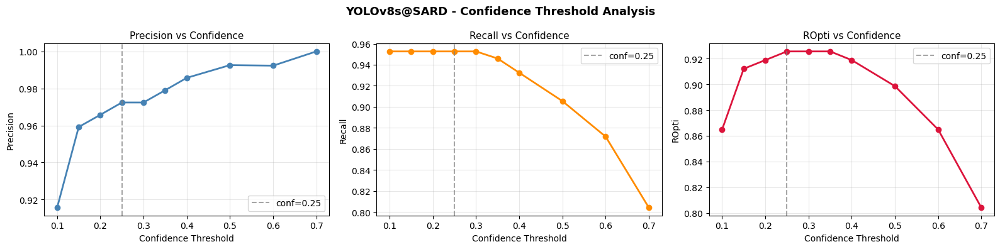


Aggregated results per confidence threshold:
 conf  Precision   Recall    ROpti
 0.10   0.915584 0.952703 0.864865
 0.15   0.959184 0.952703 0.912162
 0.20   0.965753 0.952703 0.918919
 0.25   0.972414 0.952703 0.925676
 0.30   0.972414 0.952703 0.925676
 0.35   0.979021 0.945946 0.925676
 0.40   0.985714 0.932432 0.918919
 0.50   0.992593 0.905405 0.898649
 0.60   0.992308 0.871622 0.864865
 0.70   1.000000 0.804054 0.804054


In [30]:
def sweep_confidence(
    model, img_dir: Path, lbl_dir: Path,
    thresholds=None, iou_thresh: float = 0.5, sample_size: int = 100
):
    """Sweep confidence thresholds and compute aggregated Precision, Recall, ROpti."""
    if thresholds is None:
        thresholds = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7]

    images = sorted(img_dir.glob('*.*'))
    if len(images) > sample_size:
        images = random.sample(images, sample_size)

    rows = []
    for conf in thresholds:
        TP = FP = FN = 0
        for img_path in tqdm(images, desc=f'conf={conf:.2f}', leave=False):
            lbl_path = lbl_dir / (img_path.stem + '.txt')
            img = Image.open(img_path)
            W, H = img.size
            gt_boxes = []
            if lbl_path.exists():
                with open(lbl_path) as f:
                    for line in f:
                        p = line.strip().split()
                        if len(p) < 5:
                            continue
                        _, cx, cy, bw, bh = map(float, p[:5])
                        gt_boxes.append([
                            (cx - bw / 2) * W, (cy - bh / 2) * H,
                            (cx + bw / 2) * W, (cy + bh / 2) * H
                        ])
            preds = model.predict(str(img_path), conf=conf,
                                  imgsz=IMG_SIZE, verbose=False)
            pred_boxes = []
            if preds and preds[0].boxes is not None:
                pred_boxes = preds[0].boxes.xyxy.cpu().numpy().tolist()
            matched = set()
            for pb in pred_boxes:
                best_iou, best_idx = 0, -1
                for gi, gb in enumerate(gt_boxes):
                    if gi in matched:
                        continue
                    ix1 = max(pb[0], gb[0]); iy1 = max(pb[1], gb[1])
                    ix2 = min(pb[2], gb[2]); iy2 = min(pb[3], gb[3])
                    inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
                    ap = (pb[2] - pb[0]) * (pb[3] - pb[1])
                    ag = (gb[2] - gb[0]) * (gb[3] - gb[1])
                    iou_v = inter / (ap + ag - inter + 1e-6)
                    if iou_v > best_iou:
                        best_iou, best_idx = iou_v, gi
                if best_iou >= iou_thresh and best_idx >= 0:
                    TP += 1
                    matched.add(best_idx)
                else:
                    FP += 1
            FN += len(gt_boxes) - len(matched)
        # Aggregate one row per threshold
        rows.append(dict(
            conf      = conf,
            Precision = TP / (TP + FP + 1e-6),
            Recall    = TP / (TP + FN + 1e-6),
            ROpti     = (TP - FP) / (TP + FN + 1e-6)
        ))
    return pd.DataFrame(rows)


print('Running confidence threshold sweep...')
sweep_df = sweep_confidence(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    sample_size=100
)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, col, color in zip(axes,
                          ['Precision', 'Recall', 'ROpti'],
                          ['steelblue', 'darkorange', 'crimson']):
    ax.plot(sweep_df['conf'], sweep_df[col], marker='o', color=color, lw=2)
    ax.axvline(0.25, linestyle='--', color='gray', alpha=0.7, label='conf=0.25')
    ax.set_xlabel('Confidence Threshold')
    ax.set_ylabel(col)
    ax.set_title(f'{col} vs Confidence', fontsize=11)
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('YOLOv8s@SARD - Confidence Threshold Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
save_path = OUTPUT_DIR / 'confidence_sweep.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print('\nAggregated results per confidence threshold:')
print(sweep_df.to_string(index=False))


In [31]:
print('Exporting to ONNX...')
onnx_path = best_model.export(format='onnx', imgsz=IMG_SIZE, opset=12, simplify=True)
print(f'ONNX model saved: {onnx_path}')

for fname in ['best.pt', 'last.pt']:
    src = OUTPUT_DIR / RUN_NAME / 'weights' / fname
    if src.exists():
        shutil.copy(src, OUTPUT_DIR / fname)
        print(f'Copied {fname} -> {OUTPUT_DIR / fname}')


Exporting to ONNX...
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)

PyTorch: starting from '/kaggle/working/outputs/yolov8s_sard_person/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)

ONNX: starting export with onnx 1.20.1 opset 12...
ONNX: slimming with onnxslim 0.1.91...
ONNX: export success ✅ 1.6s, saved as '/kaggle/working/outputs/yolov8s_sard_person/weights/best.onnx' (42.7 MB)

Export complete (2.1s)
Results saved to /kaggle/working/outputs/yolov8s_sard_person/weights
Predict:         yolo predict task=detect model=/kaggle/working/outputs/yolov8s_sard_person/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/kaggle/working/outputs/yolov8s_sard_person/weights/best.onnx imgsz=640 data=/kaggle/working/sard_yolo/data.yaml  
Visualize:       https://netron.app
ONNX model saved: /kaggle/working/outputs/yolov8s_sard_person/weights/best.onnx
Copied best.pt -> /kaggle/working

In [32]:
print('\n' + '='*60)
print(' FINAL SUMMARY')
print('='*60)
print(f'  Model          : YOLOv8s fine-tuned on SARD')
print(f'  Epochs trained : {EPOCHS}')
print(f'  Image size     : {IMG_SIZE} px')
print(f'  Batch size     : {BATCH_SIZE}')
print()
print('  Metric               COCO baseline    SARD fine-tuned    Delta')
print('  ' + '-'*65)
rows_summary = [
    ('Precision (%)',    coco_p,   our_p),
    ('Recall (%)',       coco_r,   our_r),
    ('mAP@0.5 (%)',      coco_m50, our_m50),
    ('mAP@0.5:0.95 (%)',coco_m95, our_m95),
    ('ROpti',           coco_ropti_results['ROpti'], ropti_results['ROpti']),
]
for name, base, ours in rows_summary:
    delta = ours - base
    sign  = '+' if delta >= 0 else ''
    print(f'  {name:<22} {base:>12.2f}     {ours:>12.2f}    {sign}{delta:.2f}')
print()
print(f'  Speed: COCO {coco_avg_ms:.1f} ms/img  |  SARD {avg_ms:.1f} ms/img')
print()
print('  --- Output Files ---')
for fp in sorted(OUTPUT_DIR.rglob('*')):
    if fp.is_file():
        print(f'  {fp.relative_to(OUTPUT_DIR)}')



 FINAL SUMMARY
  Model          : YOLOv8s fine-tuned on SARD
  Epochs trained : 50
  Image size     : 640 px
  Batch size     : 16

  Metric               COCO baseline    SARD fine-tuned    Delta
  -----------------------------------------------------------------
  Precision (%)                 92.79            96.95    +4.16
  Recall (%)                    20.23            91.34    +71.11
  mAP@0.5 (%)                   19.96            91.31    +71.35
  mAP@0.5:0.95 (%)              11.74            64.46    +52.72
  ROpti                          0.20             0.89    +0.69

  Speed: COCO 15.8 ms/img  |  SARD 15.7 ms/img

  --- Output Files ---
  bbox_distribution.png
  best.pt
  coco_vs_sard_comparison.png
  coco_vs_sard_visual.png
  confidence_sweep.png
  last.pt
  predictions_visualization.png
  sample_images.png
  training_curves.png
  yolov8s_sard_person/BoxF1_curve.png
  yolov8s_sard_person/BoxPR_curve.png
  yolov8s_sard_person/BoxP_curve.png
  yolov8s_sard_person/BoxR_cu